In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
os.environ['TOKENIZERS_PARALLELISM'] = 'false'
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

In [19]:
import torch
from dotenv import load_dotenv
import io
from google.cloud import storage
from transformers import AutoTokenizer, AutoModelForCausalLM, BitsAndBytesConfig, GenerationConfig
import pandas as pd
import numpy as np
from IPython.display import display, Markdown
from copy import deepcopy
import seaborn as sns
import matplotlib.pyplot as plt
import os
from concurrent.futures import ProcessPoolExecutor, as_completed
import pandas as pd

### This package will be included in our repo, but it is only a prompt template

In [3]:
from golemai.nlp.prompts import QUERY_INTRO_NO_ANS, SYSTEM_MSG_RAG, SYSTEM_MSG_RAG_SHORT
from golemai.nlp.llm_module import prepare_prompt
from golemai.nlp.llm_resp_gen import LLMRespGen

In [4]:
load_dotenv(), torch.cuda.is_available()

(True, True)

In [5]:
DATA_DIR = 'data'
SCRIPTS_DIR = 'scripts'
ATT_DIR = 'attentions'
GEMMA_DIR = 'gemma2_new_dataset_0_1476'

TRAIN_SAMPLE_FILE = 'train_research_sample.parquet'
TEST_SAMPLE_FILE = 'test_research_sample.parquet'

QUESTION_COL = 'question'
CONTEXT_COL = 'context'
ANSWER_COL = 'answer'

# DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

In [6]:
MODEL_ID = "unsloth/gemma-2-9b-it-bnb-4bit"

In [7]:
att_path = os.path.join('..', SCRIPTS_DIR, GEMMA_DIR, ATT_DIR)
dataset_path = os.path.join("..", DATA_DIR, TRAIN_SAMPLE_FILE)

In [8]:
tokenizer = AutoTokenizer.from_pretrained(MODEL_ID, token=os.environ["HF_TOKEN"])

### Loading the dataset

In [9]:
def prep_att_pipe(
    att_path: str,
    n_context_tokens: int,
    n_prompt_tokens: int,
    offset_size: int = 16
) -> np.ndarray:
    """
    Function to prepare the attention tensor for further analysis.
    It removes the prompt tokens and the last offset_size tokens from the context.
    """

    att_tensor = np.load(att_path)
    print('Initial shape:', att_tensor.shape)
    print(f"{n_prompt_tokens = }, {n_context_tokens = }, {offset_size = }")
    att_tensor = att_tensor[..., n_prompt_tokens - offset_size: n_context_tokens, :n_context_tokens]
    print('Final shape:', att_tensor.shape)

    return att_tensor

In [10]:
def find_indices(response, spans) -> list:
    """
    Function to find the starting and ending indices of each substring in 'problematic_spans' within 'model_response'.
    Returns a list of tuples (start, end) for each problematic span.
    If a span cannot be found, it returns (None, None).
    """

    indices = []
    if isinstance(spans, str):
        spans = [spans]

    if spans is None:
        return None
    
    for span in spans:
        start = response.rfind(span)
        if start != -1:
            end = start + len(span)
            indices.append((start, end))
        else:
            indices.append((None, None))
    
    return indices

In [11]:
df = pd.read_parquet(dataset_path)
df = df.reset_index(drop=True)

In [12]:
df['contain_hallu'].value_counts(normalize=True)

contain_hallu
False    0.761815
True     0.238185
Name: proportion, dtype: float64

### Now I will find `start` and `end` indicies for `context` and `query`. Need to use tokenizer to find exact positions.

In [14]:
CONTEXT_SPAN = '`CONTEXT`:'
QUERY_SPAN = '`QUERY`:'
ANSWER_SPAN = '`ANSWER`:<end_of_turn>'

### Some test of the implementation

In [15]:
context_text = df['formatted_context'][0]

context_text_end_idx = context_text.find('`ANSWER`:<end_of_turn>')

prompt_text = context_text[:context_text_end_idx]

context_start = find_indices(prompt_text, CONTEXT_SPAN)[0][1]
context_end = find_indices(prompt_text, QUERY_SPAN)[0][0]

query_start = find_indices(prompt_text, QUERY_SPAN)[0][1]
query_end = len(prompt_text)

In [16]:
context_start, context_end

(457, 1187)

In [51]:
context_text[context_start:context_end]

' `Dokument [ "Tonga na Zimowych Igrzyskach Olimpijskich 2018" ]:` Podczas ceremonii otwarcia igrzysk w Pjongczangu reprezentacja Tonga weszła na stadion jako 80. w kolejności, a podczas ceremonii zamknięcia jako 81., w obu przypadkach pomiędzy ekipami z Togo i Pakistanu. Funkcję chorążego reprezentacji Tonga podczas ceremonii otwarcia i zamknięcia igrzysk pełnił jedyny reprezentant Tonga w Pjongczangu, Pita Taufatofua. Zawodnik ten pełnił również rolę chorążego podczas ceremonii otwarcia letnich igrzysk w Rio de Janeiro dwa lata wcześniej. Na uroczystościach otwarcia obu igrzysk olimpijskich wystąpił w tradycyjnym narodowym stroju ta’ovala, z nagim torsem i rękoma, które pokryte były dużą ilością oleju kokosowego. \n\n    '

In [52]:
query_start, query_end

(1195, 1255)

In [53]:
context_text[query_start:query_end]

' Jak nazywa się tradycyjne odzienie mieszkańców Tonga?\n\n    '

In [58]:
df.loc[df['gpt_index'] == 111]

,index,id,dataset,query,answer,context,formatted_context,context_length,answer_length,problematic_spans,model_response,gpt_index,prompt_length,hallu_indicies,hallu_tokens,contain_hallu
507,3396,hotpotqa_en_5adc70445542994650320cff,hotpotqa_en,Clive Lloyd was replaced as captain for one ma...,Sir Isaac Vivian Alexander Richards,"`Dokument [ ""West Indies A cricket team"" ]:` T...",<bos><start_of_turn>user\nYou are a helpful as...,1937,6,[],Viv Richards,111,1694,[],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",False


In [63]:
df.loc[df['gpt_index'] == 111]['hallu_tokens'][507].shape

(1696,)

In [64]:
tokenizer('Viv Richards')

{'input_ids': [2, 114061, 49639], 'attention_mask': [1, 1, 1]}

In [17]:
MODEL_ID = "unsloth/gemma-2-9b-it-bnb-4bit"
DTYPE = torch.bfloat16
LOAD_IN_4BIT = True

In [18]:
tokenizer = AutoTokenizer.from_pretrained(MODEL_ID, token=os.environ["HF_TOKEN"])

In [21]:
OFFSET_SIZE = 8
FIRST_N_TOKENS = 8

In [22]:
def process_row(row):
    att_file = f"{row['gpt_index']}.npy"
    print(f"att_file: {att_file}")

    n_context_tokens = len(row['hallu_tokens'])
    n_prompt_tokens = row['prompt_length']

    print(f"{n_prompt_tokens = }, {n_context_tokens = }")

    att_file_path = os.path.join(att_path, att_file)

    try:
        att_tensor = prep_att_pipe(att_file_path, n_prompt_tokens + FIRST_N_TOKENS, n_prompt_tokens, OFFSET_SIZE)
        # assert att_tensor.shape[-2] == OFFSET_SIZE + FIRST_N_TOKENS, f'Shape[-2] for {att_file} is not {OFFSET_SIZE + FIRST_N_TOKENS}'
        return att_tensor, None, att_file
    except Exception as e:
        print(f"Error: {e}")
        return None, att_file, att_file


In [23]:
X, errors = {}, []

with ProcessPoolExecutor() as executor:
    futures = [executor.submit(process_row, row) for _, row in df.iterrows()]
    
    for future in as_completed(futures):

        result, error, att_file = future.result()
        
        if error:
            errors.append(error)
        else:
            X[att_file] = result

print(f"Completed with {len(errors)} errors.")

att_file: 443.npyatt_file: 253.npy
att_file: 340.npyatt_file: 317.npyatt_file: 218.npy
att_file: 457.npyatt_file: 256.npyatt_file: 657.npyn_prompt_tokens = 1665, n_context_tokens = 1674att_file: 469.npy
n_prompt_tokens = 1469, n_context_tokens = 1492
att_file: 597.npy
att_file: 308.npy



n_prompt_tokens = 330, n_context_tokens = 335

n_prompt_tokens = 1476, n_context_tokens = 1493att_file: 143.npyatt_file: 219.npyn_prompt_tokens = 537, n_context_tokens = 542n_prompt_tokens = 1081, n_context_tokens = 1101att_file: 134.npyn_prompt_tokens = 646, n_context_tokens = 652n_prompt_tokens = 964, n_context_tokens = 971


n_prompt_tokens = 581, n_context_tokens = 595
att_file: 427.npyatt_file: 351.npy


att_file: 566.npy

att_file: 149.npy
att_file: 177.npyn_prompt_tokens = 528, n_context_tokens = 532
n_prompt_tokens = 1573, n_context_tokens = 1587att_file: 89.npyatt_file: 441.npy
att_file: 105.npy
att_file: 540.npyatt_file: 639.npyatt_file: 363.npyn_prompt_tokens = 312, n_context_tokens = 329



In [24]:
diff_shape = len([1 for k, v in X.items() if v.shape[-2] != OFFSET_SIZE + FIRST_N_TOKENS])
diff_shape


141

In [25]:
Y = {}

for i, row in df.iterrows():

    att_file = f"{row['gpt_index']}.npy"
    print(f"att_file: {att_file}")

    n_context_tokens = len(row['hallu_tokens'])
    n_prompt_tokens = row['prompt_length']

    print(f"{n_prompt_tokens = }, {n_context_tokens = }")

    x_2_shape = X[att_file].shape[-2]
    print(f"{x_2_shape = }")

    tok_diff = (OFFSET_SIZE + FIRST_N_TOKENS) - x_2_shape
    y = row['hallu_tokens'][n_prompt_tokens: n_prompt_tokens + FIRST_N_TOKENS - tok_diff]

    if len(y) < FIRST_N_TOKENS:
        print(f"Padding {len(y)} tokens for {att_file}")
        y = np.concatenate([y, np.zeros(FIRST_N_TOKENS - len(y))])

    print(f"{y.shape = }")
    print(f"Success: {att_file}\n\n")

    Y[att_file] = y
    

att_file: 340.npy
n_prompt_tokens = 330, n_context_tokens = 335
x_2_shape = 16
Padding 5 tokens for 340.npy
y.shape = (8,)
Success: 340.npy


att_file: 443.npy
n_prompt_tokens = 1665, n_context_tokens = 1674
x_2_shape = 16
y.shape = (8,)
Success: 443.npy


att_file: 218.npy
n_prompt_tokens = 1476, n_context_tokens = 1493
x_2_shape = 16
y.shape = (8,)
Success: 218.npy


att_file: 253.npy
n_prompt_tokens = 1469, n_context_tokens = 1492
x_2_shape = 16
y.shape = (8,)
Success: 253.npy


att_file: 597.npy
n_prompt_tokens = 528, n_context_tokens = 532
x_2_shape = 15
Padding 4 tokens for 597.npy
y.shape = (8,)
Success: 597.npy


att_file: 457.npy
n_prompt_tokens = 1081, n_context_tokens = 1101
x_2_shape = 16
y.shape = (8,)
Success: 457.npy


att_file: 657.npy
n_prompt_tokens = 964, n_context_tokens = 971
x_2_shape = 16
Padding 7 tokens for 657.npy
y.shape = (8,)
Success: 657.npy


att_file: 317.npy
n_prompt_tokens = 537, n_context_tokens = 542
x_2_shape = 16
Padding 5 tokens for 317.npy
y.shap

In [32]:
len(Y.keys()), len(X.keys())

(529, 529)

In [27]:
reverted_tokenizer = {
    v: k
    for k, v in tokenizer.get_vocab().items()
}

In [33]:
df

,index,id,dataset,query,answer,context,formatted_context,context_length,answer_length,problematic_spans,model_response,gpt_index,prompt_length,hallu_indicies,hallu_tokens,contain_hallu,context_start_idx,context_end_idx,query_start_idx,query_end_idx
0,3265,poquad_v2_9553,poquad_v2,Jak nazywa się tradycyjne odzienie mieszkańców...,ta’ovala,"`Dokument [ ""Tonga na Zimowych Igrzyskach Olim...",<bos><start_of_turn>user\nYou are a helpful as...,573,4,[],`ta’ovala`,340,330,[],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",False,100,304,308,321
1,1601,nq_2342,nq,who hosted and won the inagural world cup,Uruguay,"`Dokument [ ""Patrick Nally"" ]:` marketing for ...",<bos><start_of_turn>user\nYou are a helpful as...,1908,2,[],Uruguay hosted and won the inaugural World Cup.,443,1665,[],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",False,100,1641,1645,1656
2,1590,nq_2324,nq,who is president of india in present time,Ram Nath Kovind,"`Dokument [ ""A. P. J. Abdul Kalam"" ]:` 11th pr...",<bos><start_of_turn>user\nYou are a helpful as...,1719,5,[Nie mogę udzielić odpowiedzi na to pytanie na...,Nie mogę udzielić odpowiedzi na to pytanie na ...,218,1476,"[[6469, 6543]]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",True,100,1454,1458,1467
3,1489,nq_2177,nq,who played jennifer in back to the future,Claudia Grace Wells,"`Dokument [ ""Elisabeth Shue"" ]:` She appeared ...",<bos><start_of_turn>user\nYou are a helpful as...,1712,4,[],Claudia Wells played Jennifer in the first Bac...,253,1469,[],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",False,100,1447,1451,1460
4,4454,hotpotqa_pl_5a8dd5b855429917b4a5bcc6,hotpotqa_pl,Z jaką partią polityczną związana jest obecny ...,Republikański,"`Dokument [ ""Bob Ferguson (politician)"" ]:` Ro...",<bos><start_of_turn>user\nYou are a helpful as...,771,5,[],Republikanin,597,528,[],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",False,100,496,500,519
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524,4221,hotpotqa_en_5a7530fa5542993748c897e2,hotpotqa_en,Caldera de Taburiente National Park and Teide ...,"Canary Islands, Spain","`Dokument [ ""Echium gentianoides"" ]:` Echium g...",<bos><start_of_turn>user\nYou are a helpful as...,1400,6,[],Canary Islands,46,1157,[],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",False,100,1123,1127,1148
525,4996,polqa_1658,polqa,Kto jest głową państwa w Szwecji?,król,`Dokument [1]:` Ustrój polityczny Danii – Dani...,<bos><start_of_turn>user\nYou are a helpful as...,769,3,[Król],Król.,386,526,"[[1947, 1951]]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",True,100,501,505,517
526,3280,poquad_v2_44338,poquad_v2,Czym grozi wyznawanie innej religii niż ta dom...,buntem,"`Dokument [ ""Europa Universalis III"" ]:` Prowi...",<bos><start_of_turn>user\nYou are a helpful as...,557,3,[],Zwiększa się ryzyko buntu mieszkańców.,493,314,[],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",False,100,279,283,305
527,4474,hotpotqa_en_5a7f250955429934daa2fcf1,hotpotqa_en,Are Clarence Brown and Peter Glenville of the ...,no,"`Dokument [ ""Peter Glenville"" ]:` Peter Glenvi...",<bos><start_of_turn>user\nYou are a helpful as...,1320,2,[Nie mogę udzielić odpowiedzi na to pytanie na...,Nie mogę udzielić odpowiedzi na to pytanie na ...,451,1077,"[[4345, 4419]]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",True,100,1051,1055,1068


In [34]:
context_starts, context_ends = [], []
query_starts, query_ends = [], []

for i, row in df.iterrows():

    att_file = f"{row['gpt_index']}.npy"
    print(f"att_file: {att_file}")

    context_text = row['formatted_context']
    context_text_end_idx = context_text.find('`ANSWER`:<end_of_turn>')

    prompt_text = context_text[:context_text_end_idx]

    context_start = find_indices(prompt_text, CONTEXT_SPAN)[0][1]
    context_end = find_indices(prompt_text, QUERY_SPAN)[0][0]

    query_start = find_indices(prompt_text, QUERY_SPAN)[0][1]
    query_end = len(prompt_text)

    inputs = tokenizer(context_text, return_tensors="pt", padding=True, return_offsets_mapping=True)
    offset_mappings = inputs['offset_mapping'][0].tolist()

    print(offset_mappings)

    

    # find start and end indices of context and query

    context_token_start_idx, context_token_end_idx = None, None
    query_token_start_idx, query_token_end_idx = None, None

    for idx, (start, end) in enumerate(offset_mappings):

        if (start <= context_start <= end):
            context_token_start_idx = idx

        if (start <= context_end <= end) and (context_token_end_idx is None):
            context_token_end_idx = idx

        if (start <= query_start <= end):
            query_token_start_idx = idx
        
        if (start <= query_end <= end) and (query_token_end_idx is None):
            query_token_end_idx = idx

    context_starts.append(context_token_start_idx)
    context_ends.append(context_token_end_idx)
    query_starts.append(query_token_start_idx)
    query_ends.append(query_token_end_idx)

att_file: 340.npy
[[0, 0], [0, 5], [5, 20], [20, 24], [24, 25], [25, 28], [28, 32], [32, 34], [34, 42], [42, 52], [52, 53], [53, 58], [58, 62], [62, 67], [67, 70], [70, 73], [73, 80], [80, 90], [90, 101], [101, 107], [107, 110], [110, 114], [114, 120], [120, 128], [128, 132], [132, 136], [136, 141], [141, 150], [150, 160], [160, 161], [161, 162], [162, 166], [166, 168], [168, 172], [172, 176], [176, 180], [180, 187], [187, 191], [191, 200], [200, 205], [205, 211], [211, 214], [214, 218], [218, 227], [227, 235], [235, 236], [236, 243], [243, 247], [247, 254], [254, 255], [255, 257], [257, 260], [260, 265], [265, 268], [268, 271], [271, 274], [274, 285], [285, 288], [288, 291], [291, 299], [299, 302], [302, 312], [312, 316], [316, 321], [321, 325], [325, 328], [328, 331], [331, 333], [333, 334], [334, 339], [339, 343], [343, 351], [351, 353], [353, 360], [360, 361], [361, 365], [365, 369], [369, 375], [375, 377], [377, 382], [382, 383], [383, 389], [389, 390], [390, 397], [397, 405], [40

In [35]:
df['context_start_idx'], df['context_end_idx'] = context_starts, context_ends
df['query_start_idx'], df['query_end_idx'] = query_starts, query_ends

In [39]:
df.to_parquet(os.path.join("..", DATA_DIR, 'train_research_sample.parquet'))

In [95]:
df = pd.read_parquet(os.path.join("..", DATA_DIR, 'train_research_sample.parquet'))

In [96]:
df.head(2)

,index,id,dataset,query,answer,context,formatted_context,context_length,answer_length,problematic_spans,model_response,gpt_index,prompt_length,hallu_indicies,hallu_tokens,contain_hallu,context_start_idx,context_end_idx,query_start_idx,query_end_idx
0,3265,poquad_v2_9553,poquad_v2,Jak nazywa się tradycyjne odzienie mieszkańców...,ta’ovala,"`Dokument [ ""Tonga na Zimowych Igrzyskach Olim...",<bos><start_of_turn>user\nYou are a helpful as...,573,4,[],`ta’ovala`,340,330,[],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",False,100,304,308,321
1,1601,nq_2342,nq,who hosted and won the inagural world cup,Uruguay,"`Dokument [ ""Patrick Nally"" ]:` marketing for ...",<bos><start_of_turn>user\nYou are a helpful as...,1908,2,[],Uruguay hosted and won the inaugural World Cup.,443,1665,[],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",False,100,1641,1645,1656


In [37]:
for i in inputs['input_ids'][0][query_token_start_idx: query_token_end_idx + 1]:
    print(reverted_tokenizer[i.item()])

▁Czy
▁według
▁Ili
ady
▁Hom
era
▁Achilles
▁i
▁Hek
tor
▁byli
▁przy
jaciół
mi
?



▁▁▁▁


### Attension on context analysis

In [41]:
X[att_file].shape

(42, 16, 16, 467)

In [42]:
OFFSET_SIZE

8

In [97]:
X_context = np.array([
    X[f"{row['gpt_index']}.npy"][..., OFFSET_SIZE:, row['query_start_idx']: row['query_end_idx']].mean(axis=-1).mean(axis=-1)
    for _, row in df.iterrows()
])

Y_context = [int(any(row['hallu_tokens'][row['prompt_length']: row['prompt_length'] + FIRST_N_TOKENS])) for _, row in df.iterrows()]

In [103]:
X_context.shape, len(Y_context)

((529, 42, 16), 529)

In [100]:
FEATURE_NAMES = [
    f"layer_{i}_head_{j}" for i in range(X_context.shape[1]) for j in range(X_context.shape[2])
]

In [145]:
context_df = pd.DataFrame(X_context.reshape(X_context.shape[0], -1), columns=FEATURE_NAMES)
context_df['label'] = Y_context

In [104]:
query_df = pd.DataFrame(X_context.reshape(X_context.shape[0], -1), columns=FEATURE_NAMES)
query_df['label'] = Y_context
query_df['dataset'] = df['dataset']

In [105]:
query_df.to_parquet(os.path.join("..", DATA_DIR, 'query_features_mean_agg.parquet'))

In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from IPython.display import display, Markdown
from collections import Counter
import random
from lightgbm import LGBMClassifier

In [51]:
DATA_DIR = 'data'

In [93]:
context_df.to_parquet(os.path.join("..", DATA_DIR, 'context_features_mean_agg.parquet'))

In [52]:
context_df = pd.read_parquet(os.path.join("..", DATA_DIR, 'context_features_mean_agg.parquet'))

In [60]:
context_df['label'] = [int(any(row['hallu_tokens'][row['prompt_length']: row['prompt_length'] + FIRST_N_TOKENS])) for _, row in df.iterrows()]
context_df['dataset'] = df['dataset']

In [61]:
context_df.head(2)

,layer_0_head_0,layer_0_head_1,layer_0_head_2,layer_0_head_3,layer_0_head_4,layer_0_head_5,layer_0_head_6,layer_0_head_7,layer_0_head_8,layer_0_head_9,...,layer_41_head_8,layer_41_head_9,layer_41_head_10,layer_41_head_11,layer_41_head_12,layer_41_head_13,layer_41_head_14,layer_41_head_15,label,dataset
0,0.002806,0.002171,0.000015,0.00062,0.001307,0.000991,0.001318,0.001149,0.001608,0.002941,...,0.000076,0.000104,0.000531,0.000599,0.000240,0.000070,0.000130,0.000134,0,poquad_v2
1,0.000542,0.000518,0.000018,0.00024,0.000462,0.000565,0.000077,0.000087,0.000422,0.000585,...,0.000015,0.000009,0.000104,0.000101,0.000067,0.000007,0.000023,0.000018,0,nq


### What is the difference between attension for hallucinated and correct answers

In [106]:
stats_grouped = context_df.drop(columns=['dataset']).groupby('label').agg(['median']).T
stats_grouped['median_proportion'] = stats_grouped[0] / stats_grouped[1]
stats_grouped

,label,0,1,median_proportion
layer_0_head_0,median,0.000869,0.000713,1.218583
layer_0_head_1,median,0.000723,0.000614,1.177933
layer_0_head_2,median,0.000019,0.000049,0.385793
layer_0_head_3,median,0.000261,0.000263,0.991391
layer_0_head_4,median,0.000610,0.000530,1.150562
...,...,...,...,...
layer_41_head_11,median,0.000186,0.000133,1.397407
layer_41_head_12,median,0.000084,0.000055,1.522581
layer_41_head_13,median,0.000017,0.000010,1.623188
layer_41_head_14,median,0.000024,0.000017,1.407666


### Differences in median

In [107]:
stats_grouped_pivot.sort_values('median_proportion', ascending=False).head(10)

,feature,0_median,1_median,median_diff,median_perc_diff,median_proportion
383,layer_30_head_9,0.000389,0.000092,0.000297,76.256898,4.211750
76,layer_13_head_6,0.000532,0.000131,0.000401,75.403587,4.065634
397,layer_31_head_7,0.000266,0.000067,0.000199,74.664279,3.946996
104,layer_15_head_2,0.000369,0.000095,0.000274,74.313187,3.893048
105,layer_15_head_3,0.000446,0.000118,0.000328,73.577724,3.784685
626,layer_7_head_10,0.000338,0.000098,0.000240,71.130113,3.463817
99,layer_15_head_11,0.000078,0.000023,0.000055,70.836531,3.428947
391,layer_31_head_15,0.000504,0.000150,0.000353,70.182292,3.353712
411,layer_32_head_5,0.000299,0.000090,0.000209,69.942139,3.326917
387,layer_31_head_11,0.000297,0.000098,0.000199,66.904093,3.021522


In [108]:
stats_grouped_pivot.sort_values('median_proportion', ascending=True).head(10)

,feature,0_median,1_median,median_diff,median_perc_diff,median_proportion
8,layer_0_head_2,0.000019,0.000049,-0.000030,-159.206349,0.385793
28,layer_10_head_6,0.000179,0.000262,-0.000083,-46.138482,0.684282
35,layer_11_head_11,0.000036,0.000050,-0.000014,-40.604027,0.711217
34,layer_11_head_10,0.000048,0.000065,-0.000017,-35.785536,0.736455
404,layer_32_head_12,0.000079,0.000106,-0.000026,-33.421251,0.749506
430,layer_33_head_8,0.000015,0.000019,-0.000004,-27.290837,0.785603
432,layer_34_head_0,0.000037,0.000044,-0.000008,-20.717781,0.828378
435,layer_34_head_11,0.000013,0.000015,-0.000002,-19.194313,0.838966
614,layer_6_head_14,0.000092,0.000107,-0.000015,-16.342412,0.859532
17,layer_10_head_1,0.000117,0.000135,-0.000017,-14.852492,0.870682


### Before plotting the distributions, I will check also stats for grouped datasets

In [70]:
grouped_df = context_df.groupby(['dataset', 'label']).agg(['median']).T
grouped_df

dataset                    bioask           hotpotqa_en           hotpotqa_pl  \
label                           0         1           0         1           0   
layer_0_head_0   median  0.000509  0.000587    0.000691  0.000702    0.001081   
layer_0_head_1   median  0.000432  0.000515    0.000576  0.000600    0.000950   
layer_0_head_2   median  0.000032  0.000069    0.000007  0.000012    0.000036   
layer_0_head_3   median  0.000157  0.000255    0.000179  0.000214    0.000317   
layer_0_head_4   median  0.000417  0.000499    0.000489  0.000512    0.000729   
...                           ...       ...         ...       ...         ...   
layer_41_head_11 median  0.000149  0.000128    0.000112  0.000119    0.000239   
layer_41_head_12 median  0.000035  0.000028    0.000052  0.000040    0.000096   
layer_41_head_13 median  0.000010  0.000006    0.000011  0.000008    0.000024   
layer_41_head_14 median  0.000010  0.000004    0.000023  0.000017    0.000042   
layer_41_head_15 median  0.000016  0.000015    0.000024  0.000025    0.000043   

dataset                                  nq               polqa            \
label                           1         0         1         0         1   
layer_0_head_0   median  0.001236  0.000626  0.000638  0.000967  0.000942   
layer_0_head_1   median  0.001068  0.000543  0.000554  0.000877  0.000880   
layer_0_head_2   median  0.000103  0.000009  0.000047  0.000034  0.000089   
layer_0_head_3   median  0.000427  0.000233  0.000249  0.000277  0.000393   
layer_0_head_4   median  0.000888  0.000500  0.000495  0.000702  0.000731   
...                           ...       ...       ...       ...       ...   
layer_41_head_11 median  0.000249  0.000115  0.000101  0.000235  0.000269   
layer_41_head_12 median  0.000074  0.000067  0.000037  0.000065  0.000085   
layer_41_head_13 median  0.000014  0.000009  0.000005  0.000019  0.000018   
layer_41_head_14 median  0.000010  0.000021  0.000010  0.000027  0.000021   
layer_41_head_15 median  0.000032  0.000020  0.000019  0.000036  0.000039   

dataset                 poquad_v2            
label                           0         1  
layer_0_head_0   median  0.002198  0.002115  
layer_0_head_1   median  0.001828  0.001741  
layer_0_head_2   median  0.000113  0.000068  
layer_0_head_3   median  0.000548  0.000557  
layer_0_head_4   median  0.001601  0.001440  
...                           ...       ...  
layer_41_head_11 median  0.000524  0.000542  
layer_41_head_12 median  0.000177  0.000170  
layer_41_head_13 median  0.000044  0.000039  
layer_41_head_14 median  0.000048  0.000051  
layer_41_head_15 median  0.000070  0.000066  

[672 rows x 12 columns]

In [71]:
dataset_counts = context_df.groupby(['dataset', 'label']).size().to_frame().reset_index().rename(columns={0: 'count'})
dataset_counts

,dataset,label,count
0,bioask,0,28
1,bioask,1,9
2,hotpotqa_en,0,66
3,hotpotqa_en,1,23
4,hotpotqa_pl,0,46
5,hotpotqa_pl,1,7
6,nq,0,107
7,nq,1,35
8,polqa,0,58
9,polqa,1,9


In [76]:
TOP_N = 7

In [77]:
previous_features = []
highest_non_hallu, highest_hallu = [], []

for dataset in grouped_df.columns.levels[0]:

    stats_grouped = grouped_df[dataset].reset_index()

    stats_grouped = stats_grouped.rename(columns={'level_0': 'feature', 'level_1': 'statistic'})

    stats_grouped['median_diff'] = stats_grouped[0] - stats_grouped[1]
    stats_grouped['median_perc_diff'] = stats_grouped['median_diff'] / stats_grouped[0] * 100
    
    stats_grouped.drop(columns=['median_diff', 'statistic'], inplace=True)

    stats_grouped['median_proportion'] = stats_grouped[0] / stats_grouped[1]

    n_ok, n_hallu = dataset_counts.loc[dataset_counts['dataset'] == dataset, 'count'].values

    # display(Markdown(f"### **{dataset}**, hallu: {n_hallu}, non-hallu: {n_ok}"))

    highest_non_hallu_context = stats_grouped.sort_values('median_proportion', ascending=False).head(TOP_N)
    highest_hallu_context = stats_grouped.sort_values('median_proportion', ascending=True).head(TOP_N)

    previous_features.extend(highest_non_hallu_context['feature'].values)
    previous_features.extend(highest_hallu_context['feature'].values)

    highest_hallu.append(highest_hallu_context)
    highest_non_hallu.append(highest_non_hallu_context)

In [78]:
feature_counts = Counter(previous_features)
common_features = {feature for feature, count in feature_counts.items() if count > 1}

# Generate a random color for each common feature
def generate_random_color():
    return f'#{random.randint(0, 0xFFFFFF):06x}'

# Assign colors from the palette to common features
color_map = {feature: generate_random_color() for feature in common_features}

def highlight_common_features(s):
    return [f'color: {color_map[v]}' if v in color_map else '' for v in s]

In [79]:

display(Markdown(f"## **Highest non-hallu**"))
for df, dataset in zip(highest_non_hallu, grouped_df.columns.levels[0]):

    n_ok, n_hallu = dataset_counts.loc[dataset_counts['dataset'] == dataset, 'count'].values
    display(Markdown(f"### **{dataset}**, hallu: {n_hallu}, non-hallu: {n_ok}"))
    
    styled_df = df.style.apply(highlight_common_features, subset=['feature'])
    display(styled_df)

display(Markdown(f"## **Highest hallu**"))
for df, dataset in zip(highest_hallu, grouped_df.columns.levels[0]):

    n_ok, n_hallu = dataset_counts.loc[dataset_counts['dataset'] == dataset, 'count'].values
    display(Markdown(f"### **{dataset}**, hallu: {n_hallu}, non-hallu: {n_ok}"))

    styled_df = df.style.apply(highlight_common_features, subset=['feature'])
    display(styled_df)



## **Highest non-hallu**

### **bioask**, hallu: 9, non-hallu: 28

label,feature,0,1,median_perc_diff,median_proportion
511,layer_31_head_15,0.000387,0.000001,99.722565,360.444444
489,layer_30_head_9,0.000294,0.000001,99.594978,246.900000
214,layer_13_head_6,0.000364,0.000002,99.574329,234.923077
250,layer_15_head_10,0.000441,0.000003,99.229521,129.789474
272,layer_17_head_0,0.000335,0.000020,93.961525,16.560472
329,layer_20_head_9,0.000420,0.000028,93.235961,14.784067
243,layer_15_head_3,0.000211,0.000015,93.062606,14.414634


### **hotpotqa_en**, hallu: 23, non-hallu: 66

label,feature,0,1,median_perc_diff,median_proportion
20,layer_1_head_4,0.000062,0.000005,91.391679,11.616667
56,layer_3_head_8,0.000079,0.000023,71.353185,3.490789
242,layer_15_head_2,0.000340,0.000101,70.304835,3.367552
122,layer_7_head_10,0.000209,0.000064,69.248292,3.251852
243,layer_15_head_3,0.000366,0.000132,63.864451,2.767358
236,layer_14_head_12,0.000237,0.000089,62.515692,2.667783
596,layer_37_head_4,0.000073,0.000028,62.131148,2.640693


### **hotpotqa_pl**, hallu: 7, non-hallu: 46

label,feature,0,1,median_perc_diff,median_proportion
489,layer_30_head_9,0.000419,0.000000,99.957326,2343.333333
214,layer_13_head_6,0.000687,0.000002,99.765869,427.111111
250,layer_15_head_10,0.000902,0.000003,99.722589,360.476190
511,layer_31_head_15,0.000449,0.000002,99.521785,209.111111
243,layer_15_head_3,0.000558,0.000010,98.270709,57.827160
450,layer_28_head_2,0.000636,0.000011,98.267141,57.708108
503,layer_31_head_7,0.000309,0.000007,97.781636,45.078261


### **nq**, hallu: 35, non-hallu: 107

label,feature,0,1,median_perc_diff,median_proportion
511,layer_31_head_15,0.000453,0.000000,99.947368,1900.000000
489,layer_30_head_9,0.000345,0.000001,99.792818,482.666667
214,layer_13_head_6,0.000417,0.000001,99.771429,437.500000
503,layer_31_head_7,0.000240,0.000003,98.710317,77.538462
450,layer_28_head_2,0.000416,0.000006,98.594378,71.142857
250,layer_15_head_10,0.000568,0.000012,97.806465,45.588517
123,layer_7_head_11,0.000473,0.000014,97.078086,34.224138


### **polqa**, hallu: 9, non-hallu: 58

label,feature,0,1,median_perc_diff,median_proportion
237,layer_14_head_13,0.000220,0.000035,84.052075,6.270408
236,layer_14_head_12,0.000447,0.000076,82.915778,5.853354
272,layer_17_head_0,0.000456,0.000082,82.104575,5.588020
384,layer_24_head_0,0.000687,0.000141,79.427083,4.860759
230,layer_14_head_6,0.000245,0.000053,78.420413,4.634009
331,layer_20_head_11,0.000589,0.000131,77.690129,4.482321
315,layer_19_head_11,0.000644,0.000149,76.914539,4.331731


### **poquad_v2**, hallu: 21, non-hallu: 120

label,feature,0,1,median_perc_diff,median_proportion
251,layer_15_head_11,0.000180,0.000056,68.950679,3.220682
237,layer_14_head_13,0.000453,0.000151,66.666667,3.000000
297,layer_18_head_9,0.000504,0.000176,65.177305,2.871690
454,layer_28_head_6,0.001616,0.000569,64.778761,2.839196
517,layer_32_head_5,0.001322,0.000494,62.590188,2.673095
458,layer_28_head_10,0.001317,0.000494,62.527154,2.668599
415,layer_25_head_15,0.001210,0.000461,61.918834,2.625970


## **Highest hallu**

### **bioask**, hallu: 9, non-hallu: 28

label,feature,0,1,median_perc_diff,median_proportion
166,layer_10_head_6,0.000096,0.000216,-123.911029,0.446606
247,layer_15_head_7,0.000019,0.000042,-122.955975,0.448519
206,layer_12_head_14,0.000146,0.000324,-122.604423,0.449227
239,layer_14_head_15,0.000017,0.000037,-121.592920,0.451278
2,layer_0_head_2,0.000032,0.000069,-116.246499,0.462435
93,layer_5_head_13,0.000039,0.000082,-112.153846,0.471356
186,layer_11_head_10,0.000033,0.000066,-98.032200,0.504968


### **hotpotqa_en**, hallu: 23, non-hallu: 66

label,feature,0,1,median_perc_diff,median_proportion
98,layer_6_head_2,0.000096,0.000181,-88.447205,0.530653
259,layer_16_head_3,0.000042,0.000072,-71.794872,0.582090
166,layer_10_head_6,0.000119,0.000196,-65.149610,0.605512
2,layer_0_head_2,0.000007,0.000012,-64.166667,0.609137
186,layer_11_head_10,0.000034,0.000055,-63.153233,0.612921
7,layer_0_head_7,0.000098,0.000157,-60.901340,0.621499
283,layer_17_head_11,0.000060,0.000092,-55.077539,0.644839


### **hotpotqa_pl**, hallu: 7, non-hallu: 46

label,feature,0,1,median_perc_diff,median_proportion
2,layer_0_head_2,0.000036,0.000103,-183.251232,0.353043
166,layer_10_head_6,0.000179,0.000427,-138.666667,0.418994
539,layer_33_head_11,0.000013,0.000025,-92.111369,0.520531
570,layer_35_head_10,0.000041,0.000075,-84.446075,0.542164
536,layer_33_head_8,0.000013,0.000024,-83.143508,0.546020
540,layer_33_head_12,0.000138,0.000242,-74.924601,0.571675
68,layer_4_head_4,0.000282,0.000486,-72.515856,0.579657


### **nq**, hallu: 35, non-hallu: 107

label,feature,0,1,median_perc_diff,median_proportion
2,layer_0_head_2,0.000009,0.000047,-415.131579,0.194125
186,layer_11_head_10,0.000023,0.000051,-119.289340,0.456019
93,layer_5_head_13,0.000038,0.000066,-75.079365,0.571170
98,layer_6_head_2,0.000131,0.000225,-72.080292,0.581124
166,layer_10_head_6,0.000142,0.000238,-67.731092,0.596192
536,layer_33_head_8,0.000011,0.000019,-67.368421,0.597484
539,layer_33_head_11,0.000010,0.000016,-53.488372,0.651515


### **polqa**, hallu: 9, non-hallu: 58

label,feature,0,1,median_perc_diff,median_proportion
2,layer_0_head_2,0.000034,0.000089,-159.181897,0.385829
166,layer_10_head_6,0.000178,0.000349,-95.585284,0.511286
524,layer_32_head_12,0.000059,0.000109,-85.794013,0.538230
76,layer_4_head_12,0.000132,0.000240,-82.691436,0.547371
555,layer_34_head_11,0.000012,0.000020,-72.448980,0.579882
93,layer_5_head_13,0.000076,0.000129,-69.351056,0.590489
539,layer_33_head_11,0.000012,0.000020,-68.811881,0.592375


### **poquad_v2**, hallu: 21, non-hallu: 120

label,feature,0,1,median_perc_diff,median_proportion
187,layer_11_head_11,0.000031,0.000039,-29.044834,0.774924
186,layer_11_head_10,0.000108,0.000132,-21.495327,0.823077
152,layer_9_head_8,0.000050,0.000059,-18.009479,0.847390
508,layer_31_head_12,0.000078,0.000092,-17.927063,0.847982
109,layer_6_head_13,0.000304,0.000358,-17.910448,0.848101
361,layer_22_head_9,0.000079,0.000091,-15.543846,0.865472
163,layer_10_head_3,0.001476,0.001697,-14.959612,0.869871


In [80]:
context_df[list(common_features) + ['label', 'dataset']]

,layer_30_head_9,layer_5_head_13,layer_31_head_7,layer_14_head_12,layer_10_head_6,layer_11_head_10,layer_14_head_13,layer_33_head_11,layer_31_head_15,layer_15_head_3,layer_17_head_0,layer_0_head_2,layer_6_head_2,layer_13_head_6,layer_33_head_8,layer_15_head_10,layer_28_head_2,label,dataset
0,1.326561e-03,0.000201,0.000584,0.000746,0.000588,0.000181,0.000138,0.000018,1.389503e-03,0.001895,0.001575,0.000015,0.000424,1.825333e-03,0.000032,2.033234e-03,0.001643,0,poquad_v2
1,1.920462e-04,0.000013,0.000094,0.000101,0.000104,0.000015,0.000170,0.000013,3.275871e-04,0.000141,0.000246,0.000018,0.000160,2.858639e-04,0.000009,5.755424e-04,0.000216,0,nq
2,1.192093e-07,0.000084,0.000003,0.000023,0.000258,0.000063,0.000006,0.000018,1.788139e-07,0.000003,0.000031,0.000056,0.000291,5.364418e-07,0.000022,7.152557e-07,0.000003,1,nq
3,3.936291e-04,0.000026,0.000318,0.000433,0.000145,0.000020,0.000395,0.000008,5.826950e-04,0.000381,0.000398,0.000014,0.000162,6.437302e-04,0.000010,6.985664e-04,0.000485,0,nq
4,4.260540e-04,0.000154,0.000315,0.000622,0.000266,0.000117,0.000258,0.000013,1.199722e-03,0.000988,0.000830,0.000018,0.000439,1.229286e-03,0.000024,1.610756e-03,0.001201,0,hotpotqa_pl
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524,2.428293e-04,0.000061,0.000177,0.000123,0.000153,0.000051,0.000035,0.000014,4.854202e-04,0.000324,0.000168,0.000004,0.000099,3.745556e-04,0.000011,4.670620e-04,0.000597,0,hotpotqa_en
525,2.779961e-04,0.000258,0.000546,0.000631,0.000329,0.000086,0.000193,0.000020,6.175041e-04,0.000637,0.000811,0.000023,0.000429,7.596016e-04,0.000018,1.338005e-03,0.001125,1,polqa
526,4.890442e-03,0.000150,0.001544,0.004795,0.000687,0.000120,0.001292,0.000055,5.214691e-03,0.004158,0.003469,0.000147,0.002373,4.264832e-03,0.000030,2.115250e-03,0.004700,0,poquad_v2
527,5.960464e-08,0.000091,0.000004,0.000037,0.000386,0.000070,0.000003,0.000027,1.788139e-07,0.000003,0.000038,0.000066,0.000304,3.576279e-07,0.000034,1.907349e-06,0.000006,1,hotpotqa_en


In [81]:
plt.style.use('ggplot')

In [82]:
def viz_numeric_data(
    df: pd.DataFrame,
    numerical_columns: list,
    target_column: str,
    group_column: str = None,
    orient: str = 'v',
    fig_cols: int = 2,
    title_func: callable = None,
    **kwargs,
):

    sns.set_style("white")
    plt.rcParams['ytick.labelsize'] = 7
    plt.rcParams['ytick.labelcolor'] = '#30333b'

    plt.rcParams['xtick.labelsize'] = 7
    plt.rcParams['xtick.labelcolor'] = '#30333b'

    n_of_cols = len(numerical_columns)
    n_rows = n_of_cols // fig_cols + n_of_cols % fig_cols
    fig, ax = plt.subplots(n_rows, fig_cols, figsize=(12, 4 * n_rows), dpi=120)

    ax = ax.flatten()

    palette = {
        0: '#c9c7c7',
        1: '#4375e8'
    }

    for i, col in enumerate(numerical_columns):

        if col == target_column:
            continue

        sns.violinplot(
            hue=target_column if isinstance(target_column, str) else None, 
            y=col if orient == 'v' else group_column,
            data=df.loc[(df[col].quantile(0.95) > df[col]) & (df[col] > df[col].quantile(0.05))], 
            orient=orient, 
            x=group_column if orient == 'v' else col,
            ax=ax[i],
            palette=palette,
            legend=False
        )

        sns.stripplot(
            x=group_column if orient == 'v' else col, 
            y=col if orient == 'v' else group_column,
            data=df.loc[(df[col].quantile(0.99) > df[col]) & (df[col] > df[col].quantile(0.01))], 
            orient=orient,
            hue=target_column,
            ax=ax[i],
            palette='dark:black',
            alpha=0.1,  # Transparency for better visibility
            jitter=True,  # Add some jitter to avoid overlap
            dodge=True,
            legend=False
        )

        ax[i].set_xlabel('')
        ax[i].set_ylabel('')
        ax[i].set_title(title_func(col), loc='left', fontsize=12, pad=kwargs.get('title_pad', 1))


        if orient == 'v':
            ax[i].tick_params(axis='y', which='both', left=True, right=False, labelleft=True, color='gray', size=3)
        else:
            ax[i].tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True, color='gray', size=3)
        
        # ax[i].grid(False)
    
        ax[i].spines['top'].set_visible(False)
        ax[i].spines['right'].set_visible(False)

        ax[i].spines['bottom'].set_visible(False if orient == 'v' else True)
        ax[i].spines['left'].set_visible(True if orient == 'v' else False)

        ax[i].spines['left'].set_color('gray')
        ax[i].spines['bottom'].set_color('gray')

    for j in range(i + 1, len(ax)):
        fig.delaxes(ax[j])

    fig.tight_layout(h_pad=5, w_pad=3)
    plt.show()

### Whole dataset without grouping

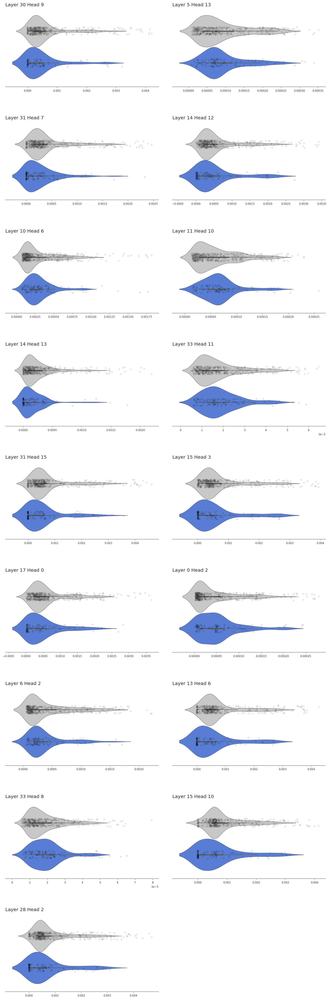

In [83]:
viz_numeric_data(
    context_df[list(common_features) + ['label', 'dataset']],
    list(common_features),
    'label',
    group_column=None,
    fig_cols=2,
    orient='h',
    title_func=lambda x: " ".join(x.split('_')).title()
)

### Grouped by dataset

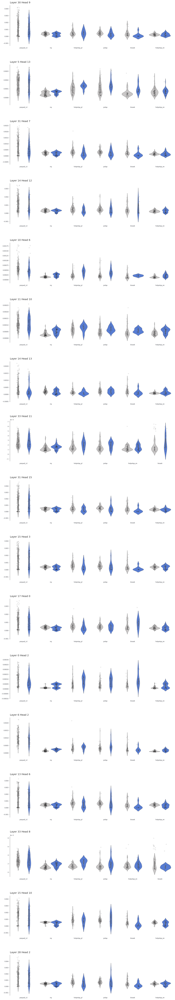

In [84]:
viz_numeric_data(
    context_df[list(common_features) + ['label', 'dataset']],
    list(common_features),
    'label',
    group_column='dataset',
    fig_cols=1,
    orient='v',
    title_func=lambda x: " ".join(x.split('_')).title(),
    title_pad=10,
)

In [85]:
context_df[list(common_features) + ['label', 'dataset']]

,layer_30_head_9,layer_5_head_13,layer_31_head_7,layer_14_head_12,layer_10_head_6,layer_11_head_10,layer_14_head_13,layer_33_head_11,layer_31_head_15,layer_15_head_3,layer_17_head_0,layer_0_head_2,layer_6_head_2,layer_13_head_6,layer_33_head_8,layer_15_head_10,layer_28_head_2,label,dataset
0,1.326561e-03,0.000201,0.000584,0.000746,0.000588,0.000181,0.000138,0.000018,1.389503e-03,0.001895,0.001575,0.000015,0.000424,1.825333e-03,0.000032,2.033234e-03,0.001643,0,poquad_v2
1,1.920462e-04,0.000013,0.000094,0.000101,0.000104,0.000015,0.000170,0.000013,3.275871e-04,0.000141,0.000246,0.000018,0.000160,2.858639e-04,0.000009,5.755424e-04,0.000216,0,nq
2,1.192093e-07,0.000084,0.000003,0.000023,0.000258,0.000063,0.000006,0.000018,1.788139e-07,0.000003,0.000031,0.000056,0.000291,5.364418e-07,0.000022,7.152557e-07,0.000003,1,nq
3,3.936291e-04,0.000026,0.000318,0.000433,0.000145,0.000020,0.000395,0.000008,5.826950e-04,0.000381,0.000398,0.000014,0.000162,6.437302e-04,0.000010,6.985664e-04,0.000485,0,nq
4,4.260540e-04,0.000154,0.000315,0.000622,0.000266,0.000117,0.000258,0.000013,1.199722e-03,0.000988,0.000830,0.000018,0.000439,1.229286e-03,0.000024,1.610756e-03,0.001201,0,hotpotqa_pl
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524,2.428293e-04,0.000061,0.000177,0.000123,0.000153,0.000051,0.000035,0.000014,4.854202e-04,0.000324,0.000168,0.000004,0.000099,3.745556e-04,0.000011,4.670620e-04,0.000597,0,hotpotqa_en
525,2.779961e-04,0.000258,0.000546,0.000631,0.000329,0.000086,0.000193,0.000020,6.175041e-04,0.000637,0.000811,0.000023,0.000429,7.596016e-04,0.000018,1.338005e-03,0.001125,1,polqa
526,4.890442e-03,0.000150,0.001544,0.004795,0.000687,0.000120,0.001292,0.000055,5.214691e-03,0.004158,0.003469,0.000147,0.002373,4.264832e-03,0.000030,2.115250e-03,0.004700,0,poquad_v2
527,5.960464e-08,0.000091,0.000004,0.000037,0.000386,0.000070,0.000003,0.000027,1.788139e-07,0.000003,0.000038,0.000066,0.000304,3.576279e-07,0.000034,1.907349e-06,0.000006,1,hotpotqa_en


In [ ]:
# Plot KDE plots for each common feature
plt.figure(figsize=(15, 10))
for feature in common_features:
    sns.kdeplot(data=context_df, x=feature, hue='label', common_norm=False, fill=True)
    plt.title(f'KDE Plot for {feature}')
    plt.show()

In [86]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler, MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score

In [88]:
TOP_N_FEATURES = 7

In [ ]:
validation_results = []

# Loop over each unique dataset
for dataset in context_df['dataset'].unique():

    in_dist_sample = context_df.loc[context_df['dataset'] != dataset]
    out_dist_sample = context_df.loc[context_df['dataset'] == dataset]

    stats_grouped = in_dist_sample.drop(columns=['dataset']).groupby('label').agg(['median']).T
    stats_grouped['median_proportion'] = stats_grouped[0] / stats_grouped[1]
    stats_grouped = stats_grouped.reset_index().rename(columns={'level_0': 'feature', 'level_1': 'statistic'})

    # print(stats_grouped)

    train_columns = stats_grouped.sort_values('median_proportion', ascending=False).head(TOP_N_FEATURES)['feature'].values.tolist() \
        + stats_grouped.sort_values('median_proportion', ascending=True).head(TOP_N_FEATURES)['feature'].values.tolist()

    print(f"Train columns: {train_columns}")

    X_train, X_val = in_dist_sample[train_columns], out_dist_sample[train_columns]
    y_train, y_val = in_dist_sample['label'], out_dist_sample['label']
    
    scaler = RobustScaler()
    X_train = scaler.fit_transform(X_train)
    X_val = scaler.transform(X_val)

    print(f"{X_train.shape = }, {X_val.shape = }")

    models = {
        'LogisticRegression': LogisticRegression(max_iter=10000, class_weight='balanced', random_state=42),
        'LGBMClassifier': LGBMClassifier(
            n_estimators=25,
            learning_rate=0.005,
            max_depth=5,
            num_leaves=7,
            class_weight='balanced',
            reg_alpha=0.1,
            reg_lambda=0.1,
            random_state=42,
            n_jobs=-1,
            silent=True,
            verbose=-1
        )
    }

    for model_name, model in models.items():
        model.fit(X_train, y_train)

        train_pred = model.predict(X_train)
        train_auc = roc_auc_score(y_train, train_pred)
        print(f"Train AUC for {dataset} with {model_name}: {train_auc}")

        # Validate the model
        y_pred = model.predict(X_val)

        accuracy = accuracy_score(y_val, y_pred)
        auc = roc_auc_score(y_val, y_pred)

        # Store the result
        validation_results.append({
            'dataset': dataset,
            'model': model_name,
            'accuracy': accuracy,
            'auc': auc
        })

Train columns: ['layer_31_head_15', 'layer_13_head_6', 'layer_15_head_10', 'layer_30_head_9', 'layer_28_head_2', 'layer_15_head_3', 'layer_7_head_11', 'layer_0_head_2', 'layer_11_head_10', 'layer_10_head_6', 'layer_33_head_8', 'layer_32_head_12', 'layer_6_head_2', 'layer_11_head_11']
X_train.shape = (388, 14), X_val.shape = (141, 14)
Train AUC for poquad_v2 with LogisticRegression: 0.7252617025478966

Train AUC for poquad_v2 with LGBMClassifier: 0.7980051352952795

Train columns: ['layer_7_head_10', 'layer_30_head_2', 'layer_1_head_4', 'layer_13_head_10', 'layer_15_head_11', 'layer_15_head_3', 'layer_35_head_14', 'layer_0_head_2', 'layer_32_head_12', 'layer_11_head_11', 'layer_10_head_6', 'layer_33_head_11', 'layer_34_head_0', 'layer_34_head_11']
X_train.shape = (387, 14), X_val.shape = (142, 14)
Train AUC for nq with LogisticRegression: 0.7047443259502324

Train AUC for nq with LGBMClassifier: 0.7687312004375171

Train columns: ['layer_15_head_11', 'layer_30_head_9', 'layer_15_head_2'

In [91]:
validation_results

[{'dataset': 'poquad_v2',
  'model': 'LogisticRegression',
  'accuracy': 0.6737588652482269,
  'auc': 0.5136904761904761},
 {'dataset': 'poquad_v2',
  'model': 'LGBMClassifier',
  'accuracy': 0.7304964539007093,
  'auc': 0.5273809523809524},
 {'dataset': 'nq',
  'model': 'LogisticRegression',
  'accuracy': 0.29577464788732394,
  'auc': 0.5038718291054739},
 {'dataset': 'nq',
  'model': 'LGBMClassifier',
  'accuracy': 0.6549295774647887,
  'auc': 0.6556742323097464},
 {'dataset': 'hotpotqa_pl',
  'model': 'LogisticRegression',
  'accuracy': 0.7735849056603774,
  'auc': 0.687888198757764},
 {'dataset': 'hotpotqa_pl',
  'model': 'LGBMClassifier',
  'accuracy': 0.5283018867924528,
  'auc': 0.6677018633540373},
 {'dataset': 'polqa',
  'model': 'LogisticRegression',
  'accuracy': 0.8805970149253731,
  'auc': 0.7902298850574712},
 {'dataset': 'polqa',
  'model': 'LGBMClassifier',
  'accuracy': 0.8656716417910447,
  'auc': 0.5938697318007664},
 {'dataset': 'bioask',
  'model': 'LogisticRegress

In [92]:
pd.DataFrame(validation_results)

,dataset,model,accuracy,auc
0,poquad_v2,LogisticRegression,0.673759,0.513690
1,poquad_v2,LGBMClassifier,0.730496,0.527381
2,nq,LogisticRegression,0.295775,0.503872
3,nq,LGBMClassifier,0.654930,0.655674
4,hotpotqa_pl,LogisticRegression,0.773585,0.687888
5,hotpotqa_pl,LGBMClassifier,0.528302,0.667702
6,polqa,LogisticRegression,0.880597,0.790230
7,polqa,LGBMClassifier,0.865672,0.593870
8,bioask,LogisticRegression,0.432432,0.587302
9,bioask,LGBMClassifier,0.837838,0.742063


### What is the difference between attension for hallucinated and correct answers (`QUERY`)

In [109]:
stats_grouped = query_df.drop(columns=['dataset']).groupby('label').agg(['median']).T
stats_grouped['median_proportion'] = stats_grouped[0] / stats_grouped[1]
stats_grouped

,label,0,1,median_proportion
layer_0_head_0,median,0.002794,0.002856,0.978297
layer_0_head_1,median,0.002306,0.002146,1.074667
layer_0_head_2,median,0.000037,0.000078,0.467098
layer_0_head_3,median,0.002285,0.002702,0.845747
layer_0_head_4,median,0.002306,0.001645,1.401739
...,...,...,...,...
layer_41_head_11,median,0.001828,0.001897,0.963801
layer_41_head_12,median,0.000825,0.000825,0.999422
layer_41_head_13,median,0.000178,0.000122,1.463988
layer_41_head_14,median,0.000427,0.000206,2.075876


### Differences in median

In [111]:
stats_grouped.sort_values('median_proportion', ascending=False).head(10)

,label,0,1,median_proportion
layer_13_head_6,median,0.000154,0.000011,14.640227
layer_15_head_3,median,0.001299,0.000094,13.867006
layer_31_head_15,median,0.002007,0.000262,7.654388
layer_15_head_2,median,0.003706,0.000488,7.600978
layer_30_head_9,median,0.003057,0.000405,7.556865
layer_13_head_4,median,0.000790,0.000111,7.119227
layer_12_head_15,median,0.001178,0.000171,6.897033
layer_14_head_13,median,0.010483,0.001720,6.093126
layer_31_head_7,median,0.003195,0.000574,5.567096
layer_15_head_10,median,0.001197,0.000230,5.195343


In [112]:
stats_grouped.sort_values('median_proportion', ascending=True).head(10)

,label,0,1,median_proportion
layer_0_head_2,median,0.000037,0.000078,0.467098
layer_10_head_3,median,0.007542,0.015438,0.488510
layer_21_head_4,median,0.007820,0.013348,0.585882
layer_18_head_5,median,0.008629,0.013565,0.636108
layer_38_head_8,median,0.000326,0.000513,0.636279
layer_35_head_10,median,0.000104,0.000159,0.653688
layer_8_head_10,median,0.011787,0.017868,0.659693
layer_23_head_5,median,0.006622,0.009640,0.686981
layer_19_head_0,median,0.010239,0.014889,0.687676
layer_37_head_2,median,0.001279,0.001845,0.693023


### Before plotting the distributions, I will check also stats for grouped datasets

In [113]:
grouped_df = query_df.groupby(['dataset', 'label']).agg(['median']).T
grouped_df

dataset                    bioask           hotpotqa_en           hotpotqa_pl  \
label                           0         1           0         1           0   
layer_0_head_0   median  0.001483  0.001403    0.002855  0.002499    0.002499   
layer_0_head_1   median  0.001483  0.001460    0.002244  0.002134    0.002100   
layer_0_head_2   median  0.000093  0.000157    0.000020  0.000024    0.000070   
layer_0_head_3   median  0.001914  0.002306    0.002192  0.002546    0.001634   
layer_0_head_4   median  0.005783  0.001799    0.001623  0.001428    0.001474   
...                           ...       ...         ...       ...         ...   
layer_41_head_11 median  0.002038  0.001862    0.001724  0.001806    0.001759   
layer_41_head_12 median  0.000477  0.000685    0.001009  0.001011    0.000654   
layer_41_head_13 median  0.000139  0.000120    0.000277  0.000183    0.000182   
layer_41_head_14 median  0.000212  0.000097    0.000563  0.000381    0.000385   
layer_41_head_15 median  0.000275  0.000292    0.000557  0.000456    0.000414   

dataset                                  nq               polqa            \
label                           1         0         1         0         1   
layer_0_head_0   median  0.002083  0.002909  0.003082  0.002120  0.001863   
layer_0_head_1   median  0.001733  0.002569  0.002037  0.002016  0.001690   
layer_0_head_2   median  0.000152  0.000018  0.000074  0.000059  0.000090   
layer_0_head_3   median  0.002048  0.005795  0.003456  0.001579  0.002131   
layer_0_head_4   median  0.001543  0.003410  0.001746  0.001625  0.001618   
...                           ...       ...       ...       ...       ...   
layer_41_head_11 median  0.001711  0.001965  0.001944  0.001928  0.001895   
layer_41_head_12 median  0.000556  0.001247  0.000952  0.000741  0.000638   
layer_41_head_13 median  0.000103  0.000193  0.000098  0.000214  0.000160   
layer_41_head_14 median  0.000108  0.000503  0.000169  0.000396  0.000197   
layer_41_head_15 median  0.000333  0.000500  0.000413  0.000425  0.000479   

dataset                 poquad_v2            
label                           0         1  
layer_0_head_0   median  0.003386  0.003803  
layer_0_head_1   median  0.002727  0.002535  
layer_0_head_2   median  0.000092  0.000110  
layer_0_head_3   median  0.002076  0.002234  
layer_0_head_4   median  0.002011  0.001789  
...                           ...       ...  
layer_41_head_11 median  0.001752  0.001833  
layer_41_head_12 median  0.000621  0.000708  
layer_41_head_13 median  0.000127  0.000131  
layer_41_head_14 median  0.000246  0.000364  
layer_41_head_15 median  0.000340  0.000335  

[672 rows x 12 columns]

In [114]:
dataset_counts = query_df.groupby(['dataset', 'label']).size().to_frame().reset_index().rename(columns={0: 'count'})
dataset_counts

,dataset,label,count
0,bioask,0,28
1,bioask,1,9
2,hotpotqa_en,0,66
3,hotpotqa_en,1,23
4,hotpotqa_pl,0,46
5,hotpotqa_pl,1,7
6,nq,0,107
7,nq,1,35
8,polqa,0,58
9,polqa,1,9


In [115]:
TOP_N = 7

In [116]:
previous_features = []
highest_non_hallu, highest_hallu = [], []

for dataset in grouped_df.columns.levels[0]:

    stats_grouped = grouped_df[dataset].reset_index()

    stats_grouped = stats_grouped.rename(columns={'level_0': 'feature', 'level_1': 'statistic'})

    stats_grouped['median_diff'] = stats_grouped[0] - stats_grouped[1]
    stats_grouped['median_perc_diff'] = stats_grouped['median_diff'] / stats_grouped[0] * 100
    
    stats_grouped.drop(columns=['median_diff', 'statistic'], inplace=True)

    stats_grouped['median_proportion'] = stats_grouped[0] / stats_grouped[1]

    n_ok, n_hallu = dataset_counts.loc[dataset_counts['dataset'] == dataset, 'count'].values

    # display(Markdown(f"### **{dataset}**, hallu: {n_hallu}, non-hallu: {n_ok}"))

    highest_non_hallu_context = stats_grouped.sort_values('median_proportion', ascending=False).head(TOP_N)
    highest_hallu_context = stats_grouped.sort_values('median_proportion', ascending=True).head(TOP_N)

    previous_features.extend(highest_non_hallu_context['feature'].values)
    previous_features.extend(highest_hallu_context['feature'].values)

    highest_hallu.append(highest_hallu_context)
    highest_non_hallu.append(highest_non_hallu_context)

In [ ]:
feature_counts = Counter(previous_features)
common_features = {feature for feature, count in feature_counts.items() if count > 1}

# Assign colors from the palette to common features
color_map = {feature: generate_random_color() for feature in common_features}

In [118]:

display(Markdown(f"## **Highest non-hallu**"))
for df, dataset in zip(highest_non_hallu, grouped_df.columns.levels[0]):

    n_ok, n_hallu = dataset_counts.loc[dataset_counts['dataset'] == dataset, 'count'].values
    display(Markdown(f"### **{dataset}**, hallu: {n_hallu}, non-hallu: {n_ok}"))
    
    styled_df = df.style.apply(highlight_common_features, subset=['feature'])
    display(styled_df)

display(Markdown(f"## **Highest hallu**"))
for df, dataset in zip(highest_hallu, grouped_df.columns.levels[0]):

    n_ok, n_hallu = dataset_counts.loc[dataset_counts['dataset'] == dataset, 'count'].values
    display(Markdown(f"### **{dataset}**, hallu: {n_hallu}, non-hallu: {n_ok}"))

    styled_df = df.style.apply(highlight_common_features, subset=['feature'])
    display(styled_df)



## **Highest non-hallu**

### **bioask**, hallu: 9, non-hallu: 28

label,feature,0,1,median_perc_diff,median_proportion
489,layer_30_head_9,0.008625,0.000012,99.856949,699.053140
511,layer_31_head_15,0.009212,0.000025,99.733437,375.145631
243,layer_15_head_3,0.006336,0.000028,99.557872,226.178723
214,layer_13_head_6,0.000915,0.000007,99.205108,125.803279
450,layer_28_head_2,0.003929,0.000036,99.092840,110.234114
503,layer_31_head_7,0.006763,0.000072,98.930133,93.469522
250,layer_15_head_10,0.001670,0.000019,98.854553,87.302181


### **hotpotqa_en**, hallu: 23, non-hallu: 66

label,feature,0,1,median_perc_diff,median_proportion
214,layer_13_head_6,0.000129,0.000009,92.676186,13.654088
243,layer_15_head_3,0.000755,0.000057,92.508683,13.348788
20,layer_1_head_4,0.000182,0.000014,92.388108,13.137339
212,layer_13_head_4,0.000790,0.000069,91.219071,11.388316
40,layer_2_head_8,0.003488,0.000340,90.244736,10.250876
207,layer_12_head_15,0.001830,0.000186,89.809747,9.813299
242,layer_15_head_2,0.003346,0.000371,88.907096,9.014772


### **hotpotqa_pl**, hallu: 7, non-hallu: 46

label,feature,0,1,median_perc_diff,median_proportion
489,layer_30_head_9,0.003091,0.000017,99.444616,180.055556
237,layer_14_head_13,0.010708,0.000128,98.807668,83.869281
511,layer_31_head_15,0.003606,0.000045,98.753637,80.233422
250,layer_15_head_10,0.002003,0.000028,98.619048,72.413793
185,layer_11_head_9,0.022011,0.000504,97.710139,43.670766
243,layer_15_head_3,0.001176,0.000029,97.522294,40.359918
251,layer_15_head_11,0.018768,0.000538,97.131606,34.862710


### **nq**, hallu: 35, non-hallu: 107

label,feature,0,1,median_perc_diff,median_proportion
489,layer_30_head_9,0.004208,0.000013,99.699683,332.981132
214,layer_13_head_6,0.000299,0.000002,99.401437,167.066667
511,layer_31_head_15,0.002913,0.000026,99.113867,112.849885
243,layer_15_head_3,0.003944,0.000049,98.763902,80.899756
251,layer_15_head_11,0.036652,0.000478,98.695098,76.634098
237,layer_14_head_13,0.014114,0.000197,98.602196,71.540785
250,layer_15_head_10,0.000770,0.000014,98.173375,54.745763


### **polqa**, hallu: 9, non-hallu: 58

label,feature,0,1,median_perc_diff,median_proportion
242,layer_15_head_2,0.007059,0.000200,97.161240,35.226651
214,layer_13_head_6,0.000210,0.000011,94.619088,18.584211
511,layer_31_head_15,0.002162,0.000142,93.416409,15.189280
243,layer_15_head_3,0.001641,0.000136,91.734457,12.098418
40,layer_2_head_8,0.001490,0.000141,90.540973,10.571912
454,layer_28_head_6,0.001675,0.000160,90.435525,10.455357
250,layer_15_head_10,0.001425,0.000155,89.110070,9.182796


### **poquad_v2**, hallu: 21, non-hallu: 120

label,feature,0,1,median_perc_diff,median_proportion
214,layer_13_head_6,0.000083,0.000045,46.131805,1.856383
429,layer_26_head_13,0.008366,0.005093,39.124487,1.642697
379,layer_23_head_11,0.005936,0.003773,36.439589,1.573306
480,layer_30_head_0,0.001231,0.000784,36.265014,1.568997
94,layer_5_head_14,0.001083,0.000693,36.019375,1.562973
414,layer_25_head_14,0.005936,0.003828,35.507712,1.550573
298,layer_18_head_10,0.005041,0.003296,34.619750,1.529514


## **Highest hallu**

### **bioask**, hallu: 9, non-hallu: 28

label,feature,0,1,median_perc_diff,median_proportion
293,layer_18_head_5,0.005041,0.015152,-200.567537,0.332704
594,layer_37_head_2,0.000597,0.001789,-199.800240,0.333555
19,layer_1_head_3,0.000733,0.002190,-198.569571,0.334930
93,layer_5_head_13,0.000137,0.000382,-179.284780,0.358057
570,layer_35_head_10,0.000079,0.000207,-161.654135,0.382184
544,layer_34_head_0,0.000070,0.000184,-161.642676,0.382201
536,layer_33_head_8,0.000054,0.000128,-136.004391,0.423721


### **hotpotqa_en**, hallu: 23, non-hallu: 66

label,feature,0,1,median_perc_diff,median_proportion
163,layer_10_head_3,0.007402,0.014786,-99.742334,0.500645
86,layer_5_head_6,0.001320,0.002499,-89.237992,0.528435
354,layer_22_head_2,0.001716,0.002874,-67.537521,0.596881
249,layer_15_head_9,0.005659,0.009384,-65.824065,0.603049
616,layer_38_head_8,0.000344,0.000566,-64.493759,0.607926
101,layer_6_head_5,0.000448,0.000720,-60.489232,0.623095
373,layer_23_head_5,0.007185,0.011467,-59.596496,0.626580


### **hotpotqa_pl**, hallu: 7, non-hallu: 46

label,feature,0,1,median_perc_diff,median_proportion
2,layer_0_head_2,0.000070,0.000152,-116.986769,0.460858
570,layer_35_head_10,0.000079,0.000162,-105.425772,0.486794
616,layer_38_head_8,0.000207,0.000403,-94.987035,0.512855
544,layer_34_head_0,0.000135,0.000245,-81.850376,0.549903
86,layer_5_head_6,0.001633,0.002914,-78.504673,0.560209
408,layer_25_head_8,0.005308,0.008461,-59.396335,0.627367
226,layer_14_head_2,0.001656,0.002588,-56.336406,0.639646


### **nq**, hallu: 35, non-hallu: 107

label,feature,0,1,median_perc_diff,median_proportion
2,layer_0_head_2,0.000018,0.000074,-307.189542,0.245586
340,layer_21_head_4,0.006462,0.018967,-193.506494,0.340708
163,layer_10_head_3,0.008514,0.024689,-189.964158,0.344870
293,layer_18_head_5,0.005898,0.015900,-169.598965,0.370921
373,layer_23_head_5,0.006950,0.014656,-110.867179,0.474232
14,layer_0_head_14,0.000686,0.001391,-102.779708,0.493146
291,layer_18_head_3,0.004253,0.008156,-91.748879,0.521515


### **polqa**, hallu: 9, non-hallu: 58

label,feature,0,1,median_perc_diff,median_proportion
86,layer_5_head_6,0.002380,0.005600,-135.256410,0.425068
163,layer_10_head_3,0.006855,0.014984,-118.586533,0.457485
19,layer_1_head_3,0.000934,0.001767,-89.274770,0.528332
215,layer_13_head_7,0.000006,0.000010,-70.370370,0.586957
293,layer_18_head_5,0.009350,0.015701,-67.931457,0.595481
2,layer_0_head_2,0.000059,0.000090,-52.929293,0.653897
49,layer_3_head_1,0.000515,0.000779,-51.343837,0.660747


### **poquad_v2**, hallu: 21, non-hallu: 120

label,feature,0,1,median_perc_diff,median_proportion
456,layer_28_head_8,0.001839,0.003191,-73.502722,0.576360
507,layer_31_head_11,0.000782,0.001322,-69.024390,0.591631
578,layer_36_head_2,0.001479,0.002476,-67.429861,0.597265
304,layer_19_head_0,0.009918,0.016479,-66.153846,0.601852
415,layer_25_head_15,0.007231,0.011940,-65.127935,0.605591
147,layer_9_head_3,0.000094,0.000154,-63.009801,0.613460
384,layer_24_head_0,0.006178,0.009987,-61.654832,0.618602


### Whole dataset without grouping

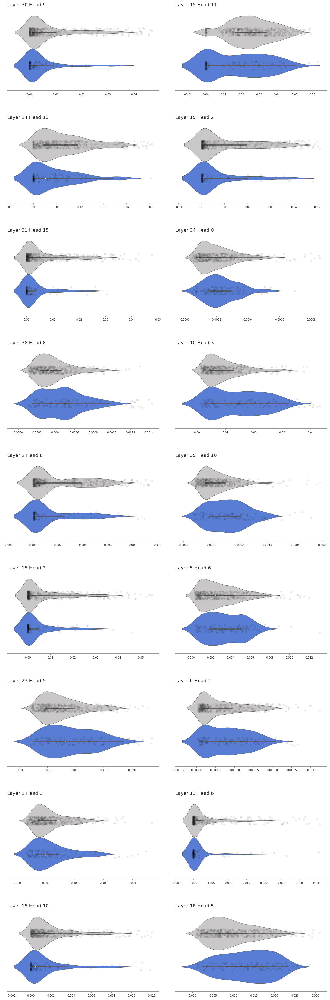

In [119]:
viz_numeric_data(
    query_df[list(common_features) + ['label', 'dataset']],
    list(common_features),
    'label',
    group_column=None,
    fig_cols=2,
    orient='h',
    title_func=lambda x: " ".join(x.split('_')).title()
)

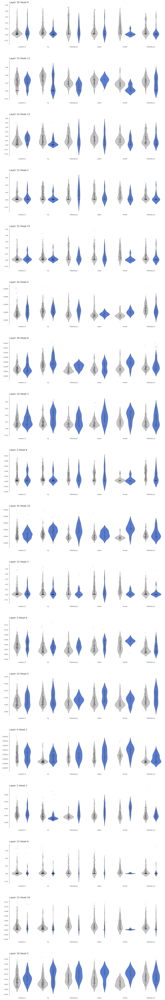

In [120]:
viz_numeric_data(
    query_df[list(common_features) + ['label', 'dataset']],
    list(common_features),
    'label',
    group_column='dataset',
    fig_cols=1,
    orient='v',
    title_func=lambda x: " ".join(x.split('_')).title(),
    title_pad=10,
)

In [127]:
validation_results = []

# Loop over each unique dataset
for dataset in query_df['dataset'].unique():

    in_dist_sample = query_df.loc[query_df['dataset'] != dataset]
    out_dist_sample = query_df.loc[query_df['dataset'] == dataset]

    stats_grouped = in_dist_sample.drop(columns=['dataset']).groupby('label').agg(['median']).T
    stats_grouped['median_proportion'] = stats_grouped[0] / stats_grouped[1]
    stats_grouped = stats_grouped.reset_index().rename(columns={'level_0': 'feature', 'level_1': 'statistic'})

    # print(stats_grouped)

    train_columns = stats_grouped.sort_values('median_proportion', ascending=False).head(TOP_N_FEATURES)['feature'].values.tolist() \
        + stats_grouped.sort_values('median_proportion', ascending=True).head(TOP_N_FEATURES)['feature'].values.tolist()

    print(f"Train columns: {train_columns}")

    X_train, X_val = in_dist_sample[train_columns], out_dist_sample[train_columns]
    y_train, y_val = in_dist_sample['label'], out_dist_sample['label']
    
    scaler = RobustScaler()
    X_train = scaler.fit_transform(X_train)
    X_val = scaler.transform(X_val)

    print(f"{X_train.shape = }, {X_val.shape = }")

    models = {
        'LogisticRegression': LogisticRegression(max_iter=10000, class_weight='balanced', random_state=42),
        'LGBMClassifier': LGBMClassifier(
            n_estimators=25,
            learning_rate=0.005,
            max_depth=5,
            num_leaves=7,
            class_weight='balanced',
            reg_alpha=0.1,
            reg_lambda=0.1,
            random_state=42,
            n_jobs=-1,
            silent=True,
            verbose=-1
        )
    }

    for model_name, model in models.items():
        model.fit(X_train, y_train)

        train_pred = model.predict(X_train)
        train_auc = roc_auc_score(y_train, train_pred)
        print(f"Train AUC for {dataset} with {model_name}: {train_auc}")

        # Validate the model
        y_pred = model.predict(X_val)

        accuracy = accuracy_score(y_val, y_pred)
        auc = roc_auc_score(y_val, y_pred)

        # Store the result
        validation_results.append({
            'dataset': dataset,
            'model': model_name,
            'accuracy': accuracy,
            'auc': auc
        })

    print('\n\n')

Train columns: ['layer_30_head_9', 'layer_31_head_15', 'layer_15_head_3', 'layer_14_head_13', 'layer_13_head_6', 'layer_11_head_9', 'layer_15_head_11', 'layer_0_head_2', 'layer_10_head_3', 'layer_18_head_5', 'layer_21_head_4', 'layer_35_head_10', 'layer_38_head_8', 'layer_0_head_14']
X_train.shape = (388, 14), X_val.shape = (141, 14)
Train AUC for poquad_v2 with LogisticRegression: 0.7312462966620581
Train AUC for poquad_v2 with LGBMClassifier: 0.7963262887616038



Train columns: ['layer_13_head_6', 'layer_15_head_3', 'layer_31_head_15', 'layer_12_head_15', 'layer_15_head_2', 'layer_13_head_4', 'layer_15_head_10', 'layer_10_head_3', 'layer_35_head_10', 'layer_8_head_10', 'layer_38_head_8', 'layer_5_head_6', 'layer_21_head_4', 'layer_18_head_5']
X_train.shape = (387, 14), X_val.shape = (142, 14)
Train AUC for nq with LogisticRegression: 0.6848509707410446
Train AUC for nq with LGBMClassifier: 0.8022969647251845



Train columns: ['layer_13_head_6', 'layer_15_head_3', 'layer_15_head_2',

In [128]:
val_df = pd.DataFrame(validation_results)
val_df

,dataset,model,accuracy,auc
0,poquad_v2,LogisticRegression,0.631206,0.547619
1,poquad_v2,LGBMClassifier,0.716312,0.519048
2,nq,LogisticRegression,0.556338,0.619092
3,nq,LGBMClassifier,0.718310,0.649666
4,hotpotqa_pl,LogisticRegression,0.830189,0.659938
5,hotpotqa_pl,LGBMClassifier,0.811321,0.709627
6,polqa,LogisticRegression,0.835821,0.670498
7,polqa,LGBMClassifier,0.880597,0.696360
8,bioask,LogisticRegression,0.945946,0.888889
9,bioask,LGBMClassifier,0.810811,0.648810
